### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku (`cv2.threshold` odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [2]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import scipy

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania. W jaki sposób ustalisz wartość progu? Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

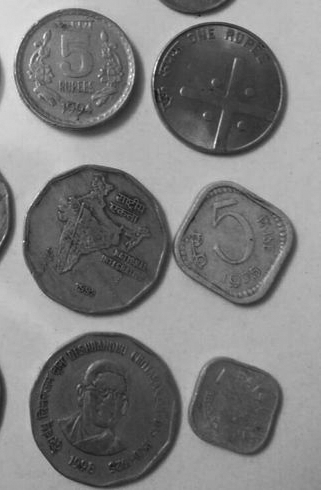

In [9]:
# 1A
monety_szare = cv2.imread('Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

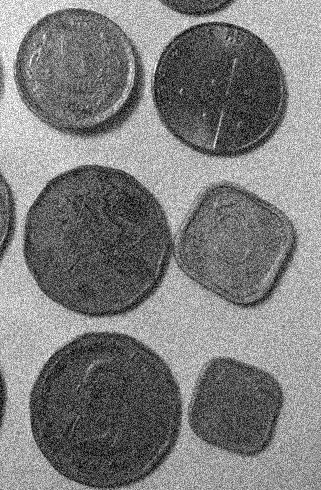

In [4]:
# 1B
monety_szare_szum = cv2.imread('Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

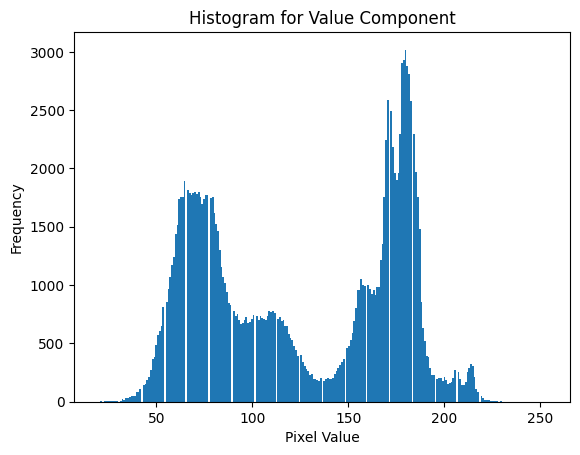

Próg:  130.0


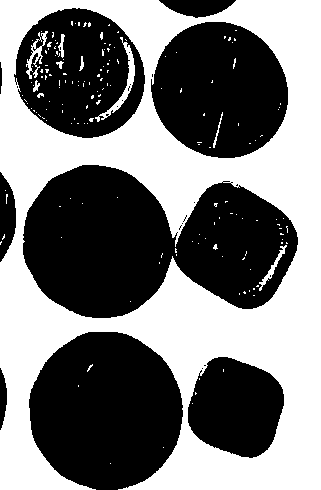

In [69]:
img_monety_gray = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)

_ = plt.hist(img_monety_gray.flatten(), bins=255)

(T, img_threshInv) = cv2.threshold(img_monety_gray, 130, 255, cv2.THRESH_BINARY)
plt.title('Histogram for Value Component')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

print('Próg: ',T)

Image.fromarray(img_threshInv)

Rozwiązanie części 1B:


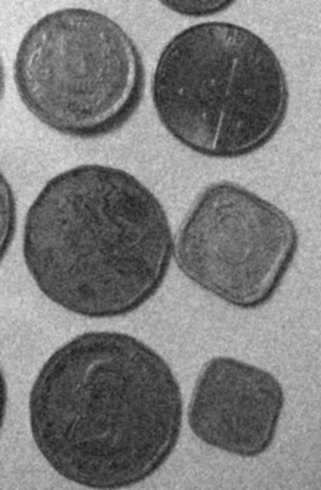

In [46]:
img_monety_szum_gray = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)

image_blured_gaussian = scipy.ndimage.gaussian_filter(img_monety_szum_gray, sigma=1.0)

Image.fromarray(image_blured_gaussian)

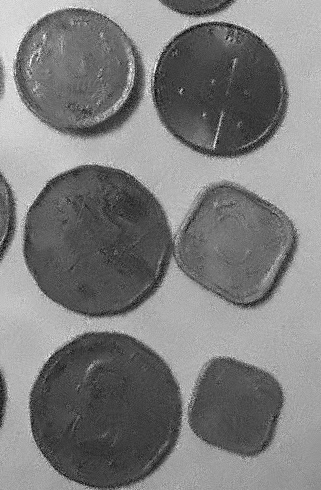

In [47]:
img_blurred_nlm = cv2.fastNlMeansDenoising(img_monety_szum_gray, None, 18, 7, 20)

Image.fromarray(img_blurred_nlm)

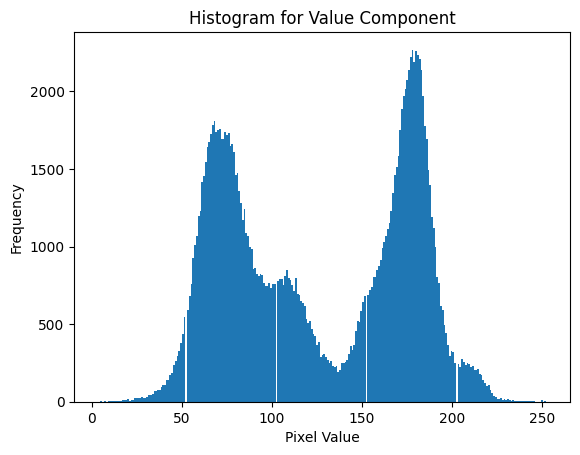

Próg:  140.0


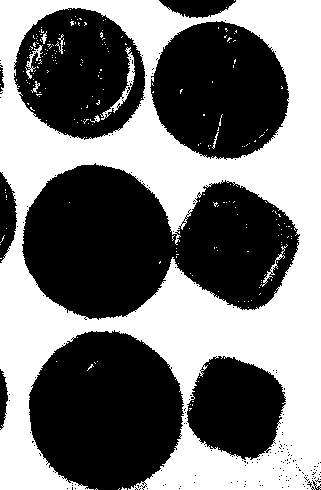

In [70]:
_ = plt.hist(img_blurred_nlm.flatten(), bins=255)

(T, img_threshInv) = cv2.threshold(img_blurred_nlm, 140, 255, cv2.THRESH_BINARY)
plt.title('Histogram for Value Component')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

print('Próg: ',T)

Image.fromarray(img_threshInv)

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Posłuż się kształtem histogramu dla wybranej składowej.

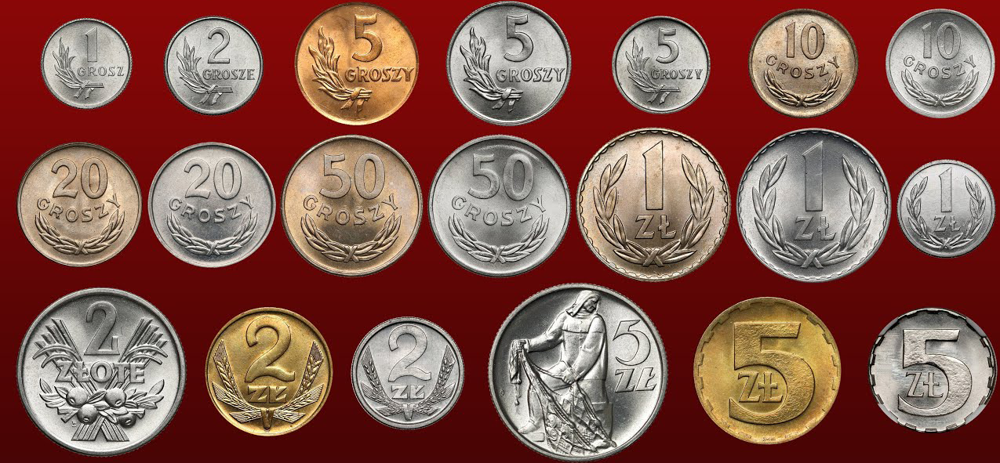

In [3]:
# 2A
monety_kolor = cv2.imread('Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

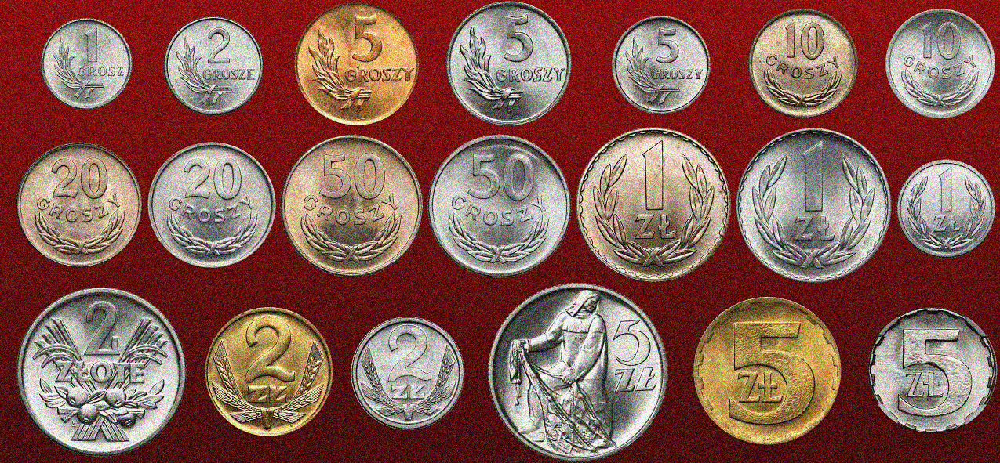

In [4]:
# 2B
monety_kolor_szum = cv2.imread('Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

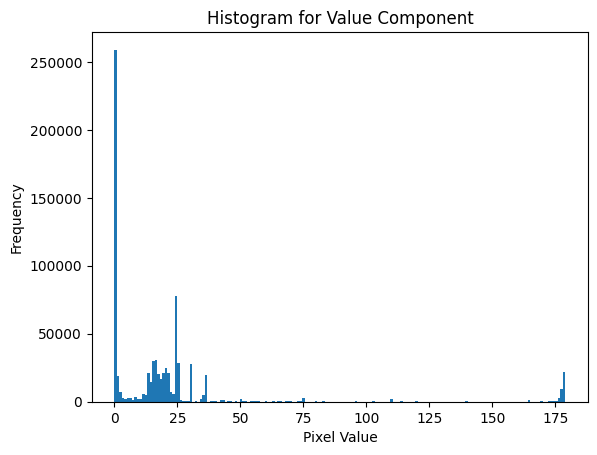

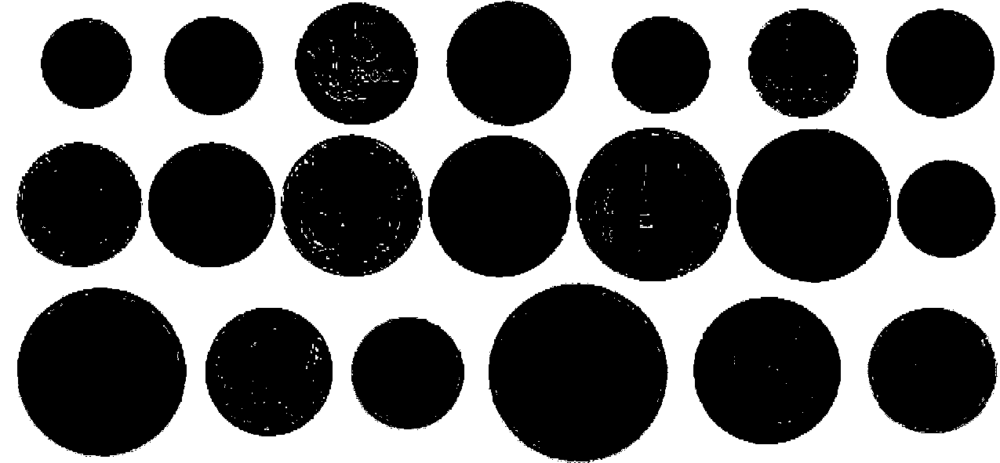

In [6]:
img_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)

h_channel = img_hsv[:, :, 0]
_ = plt.hist(h_channel.flatten(), bins=180)
plt.title('Histogram for Value Component')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

lower_red_1 = np.array([0, 50, 50])
upper_red_1 = np.array([10, 255, 255])

lower_red_2 = np.array([170, 50, 50])
upper_red_2 = np.array([180, 255, 255])

mask_red_1 = cv2.inRange(img_hsv, lower_red_1, upper_red_1)
mask_red_2 = cv2.inRange(img_hsv, lower_red_2, upper_red_2)

mask_red = cv2.bitwise_or(mask_red_1, mask_red_2)

binary_image = np.where(mask_red>0, 255, 0).astype(np.uint8)

Image.fromarray(binary_image)

Rozwiązanie części 2B:


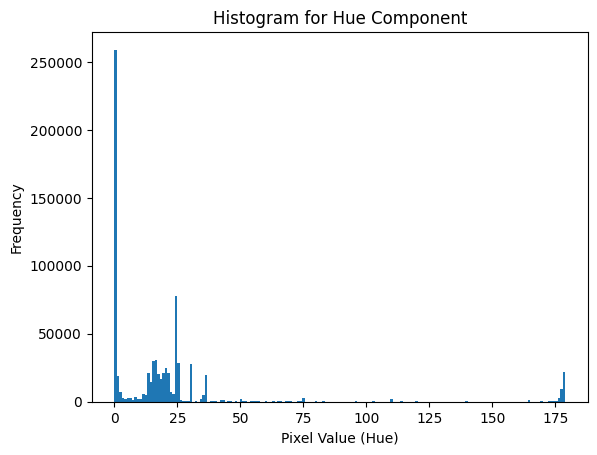

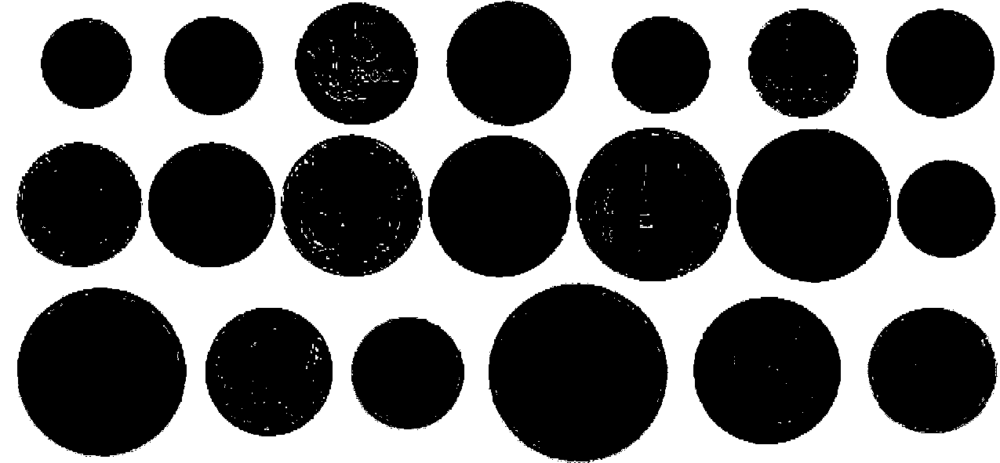

In [9]:
img_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)

h_channel = img_hsv[:, :, 0]

h_denoised = cv2.fastNlMeansDenoising(h_channel, None, 18, 7, 20)

Image.fromarray(h_denoised)

_ = plt.hist(h_channel.flatten(), bins=180)
plt.title('Histogram for Hue Component')
plt.xlabel('Pixel Value (Hue)')
plt.ylabel('Frequency')
plt.show()

lower_red_1 = np.array([0, 50, 50])
upper_red_1 = np.array([10, 255, 255])

lower_red_2 = np.array([170, 50, 50])
upper_red_2 = np.array([180, 255, 255])

mask_red_1 = cv2.inRange(img_hsv, lower_red_1, upper_red_1)
mask_red_2 = cv2.inRange(img_hsv, lower_red_2, upper_red_2)

mask_red = cv2.bitwise_or(mask_red_1, mask_red_2)

binary_image = np.where(mask_red>0, 255, 0).astype(np.uint8)

Image.fromarray(binary_image)

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

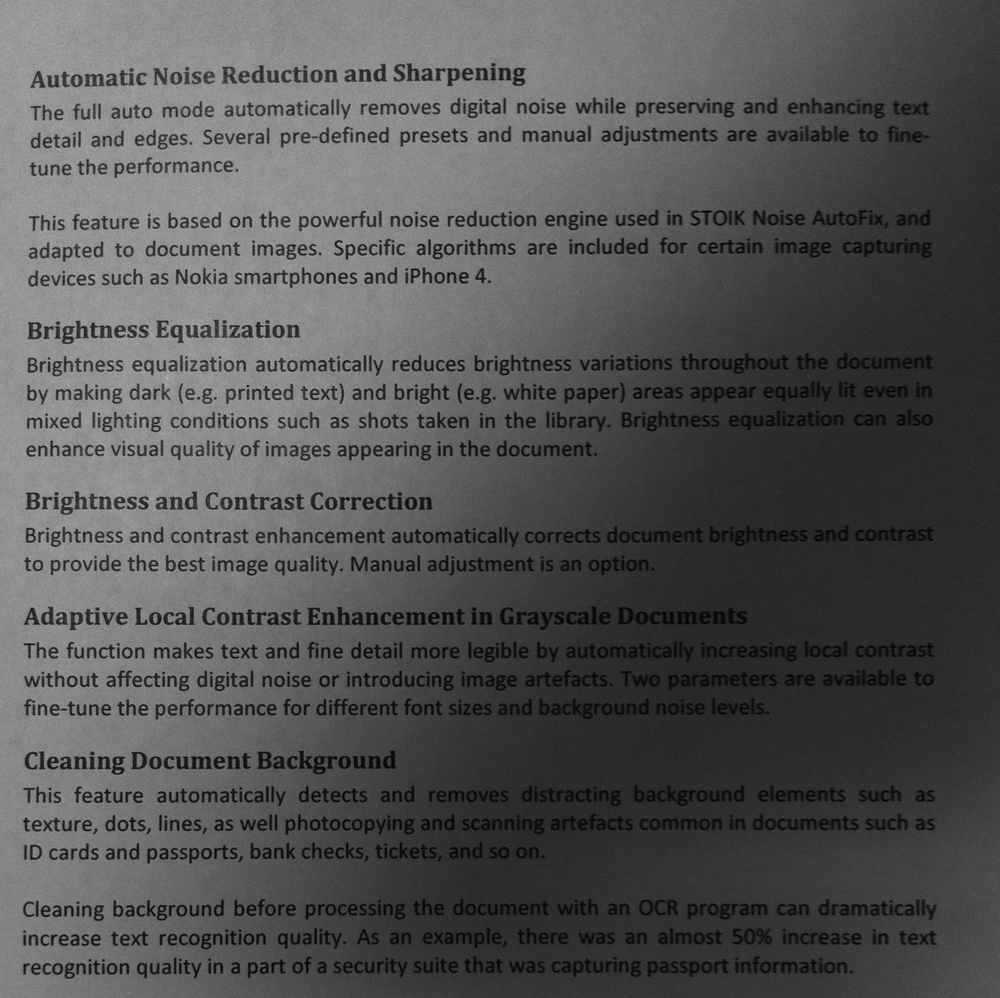

In [7]:
tekst = cv2.imread('Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

Próg:  89.0


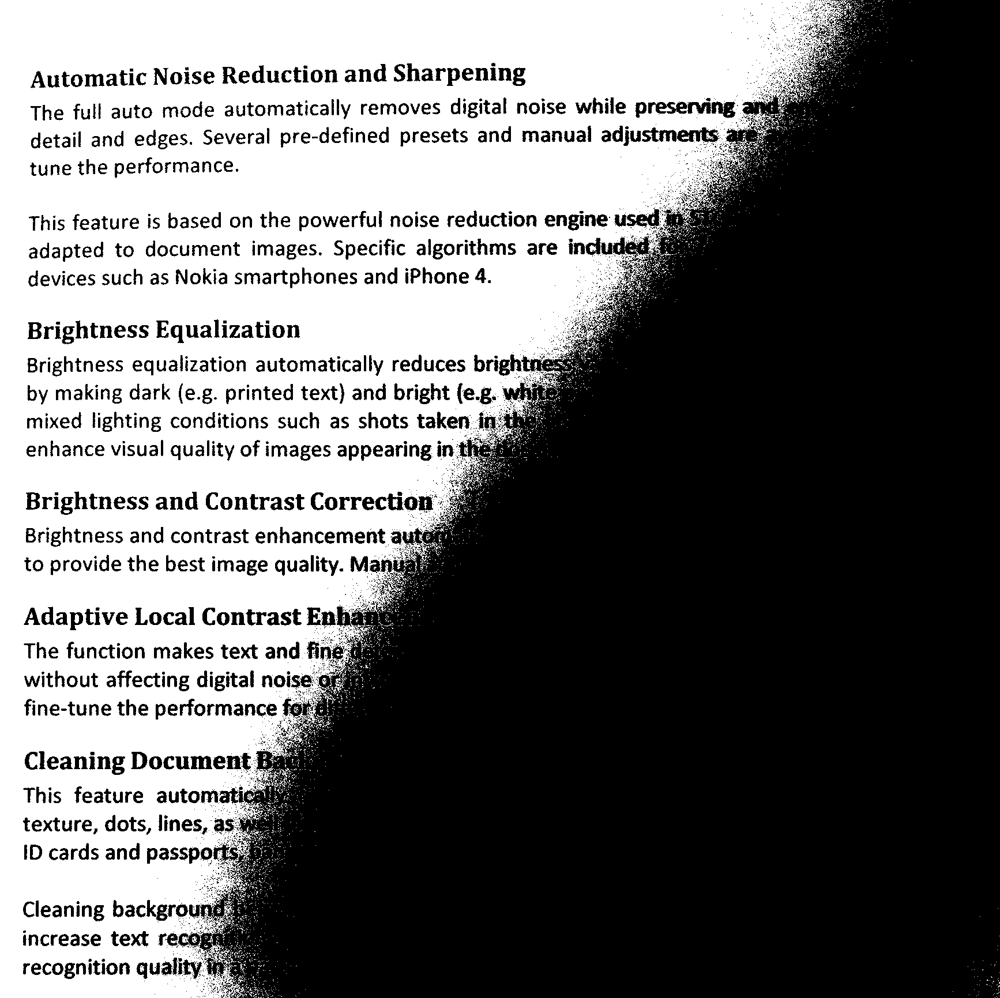

In [11]:
img = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)
T, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU)

print('Próg: ',T)

Image.fromarray(thresh)

1731 1734


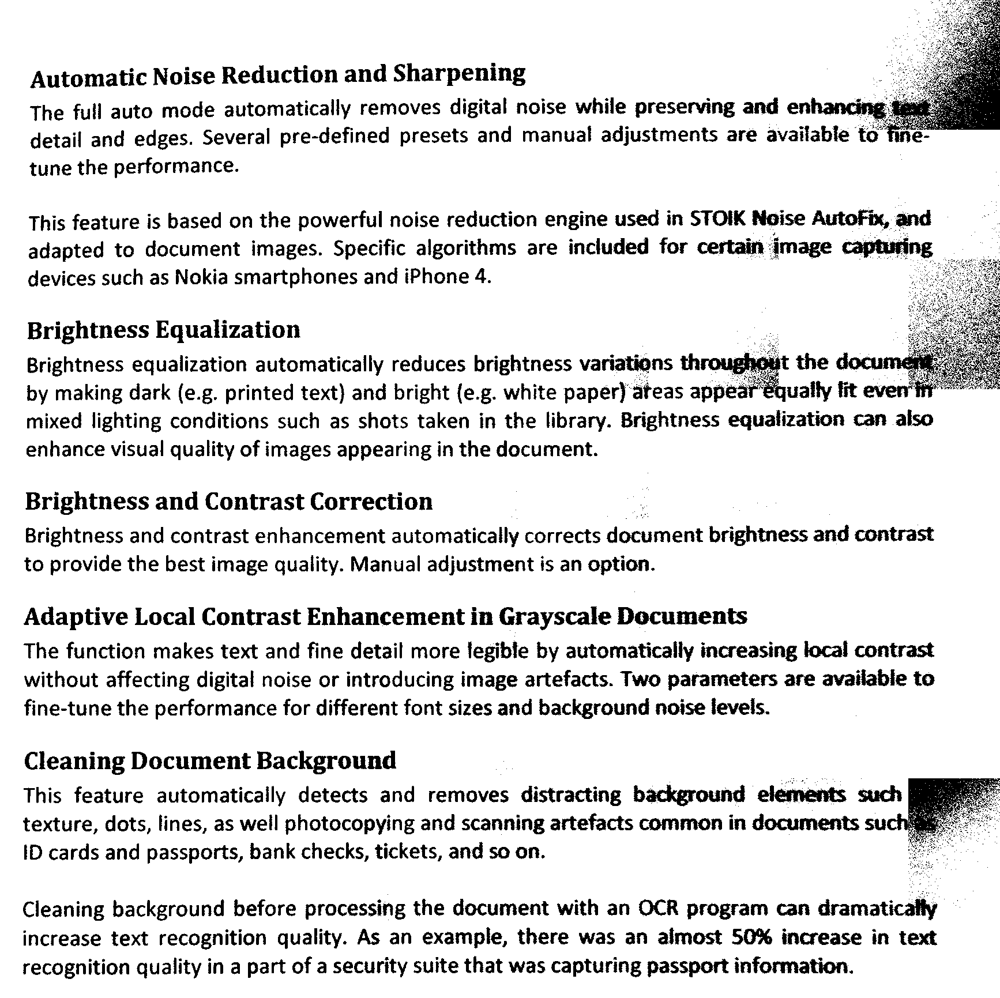

In [97]:
def sliding_window_otsu(img, window_size=(50, 50)):

    binarized = np.zeros_like(img)
    
    for y in range(0, img.shape[0], window_size[1]):
        for x in range(0, img.shape[1], window_size[0]):
            window = img[y:y+window_size[1], x:x+window_size[0]]
            
            T, thresh = cv2.threshold(window, 0, 255, cv2.THRESH_OTSU)
            
            binarized[y:y+window_size[1], x:x+window_size[0]] = thresh
            
    return binarized

img = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

binarized_img = sliding_window_otsu(img, window_size=(225, 225))

Image.fromarray(binarized_img)